# Sesión 4: Digitalización 2D y Reconocimiento de documentos
## Máster oficial en Humanidades y Patrimonio Digitales
---
Curso 2022-2023


Para esta entrega deberéis redactar un informe de **máximo 4 páginas**, donde tendreis que adjuntar las respuestas a las preguntas cerradas 1 a 3. Después tenéis que explicar los pasos que realizáis en cada apartado de la sección práctica y adjunteis las imagenes de salida de cada paso intermedio asi como su salida del OCR. Debéis justificar las decisiones que toméis.

**No es el objeto de esta practica que obtengáis un resultado perfecto del OCR, pero sí lo es que lidiéis con sus problemas más típicos**. Así pues, si hay algún paso en particular que no conduzca a mejoría o alguna idea de un paso que querríais añadir pero que no sepáis como, explicadlo en forma de texto.

Dispondréis de dos semanas desde el día de la sesión para la entrega.

## Instalar las Dependencias

Para trabajar con Tesseract necesitamos el binario instalado en nuestro sistema
(empleando el gestor de paquetes apt) y un paquete de Python que nos permitirá
usarlo dentro del entorno Jupyter:

* **[tesseract-ocr](https://tesseract-ocr.github.io)**: Instala Tesseract al
sistema linux subyacente.
* **[pytesseract](https://pypi.org/project/pytesseract/)**: Da el acceso al binario de Tesseract desde Python

In [3]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 5 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


En este punto deberiais reiniciar el entorno para que se apliquen los cambios a la instalación de PIL (una biblioteca necesaria para tratar con imágenes desde Pytesseract). <font color="red"> Tenéis el botón al final de la salida de la celda anterior </font>

In [4]:
!sudo apt install tesseract-ocr-ell
!sudo apt install tesseract-ocr-tha
!sudo apt install tesseract-ocr-spa

!tesseract --list-langs

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr-ell is already the newest version (4.00~git24-0e00fe6-1.2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 5 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr-tha is already the newest version (4.00~git24-0e00fe6-1.2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 5 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr-spa is already the newest version (4.00~git24-0e00fe6-1.2).
The following package was automatically installed and is no longer required:
  libnv

Se pueden mirar las opciones de entrada posibles al sistema Tesseract empleando el comando ```--help-extra```. De este modo comprobamos también que la instalación fue exitosa.



In [5]:
!tesseract --help-extra

Usage:
  tesseract --help | --help-extra | --help-psm | --help-oem | --version
  tesseract --list-langs [--tessdata-dir PATH]
  tesseract --print-parameters [options...] [configfile...]
  tesseract imagename|imagelist|stdin outputbase|stdout [options...] [configfile...]

OCR options:
  --tessdata-dir PATH   Specify the location of tessdata path.
  --user-words PATH     Specify the location of user words file.
  --user-patterns PATH  Specify the location of user patterns file.
  -l LANG[+LANG]        Specify language(s) used for OCR.
  -c VAR=VALUE          Set value for config variables.
                        Multiple -c arguments are allowed.
  --psm NUM             Specify page segmentation mode.
  --oem NUM             Specify OCR Engine mode.
NOTE: These options must occur before any configfile.

Page segmentation modes:
  0    Orientation and script detection (OSD) only.
  1    Automatic page segmentation with OSD.
  2    Automatic page segmentation, but no OSD, or OCR.
  3    F

Ahora se puede importar la libreria que actúa como puente para Tesseract en un entorno Python.

*   `import pytesseract`

Esto os permitirá hacer llamadas a Tesseract y emplear sus salidas mediante objetos de Python. [Aquí](https://github.com/madmaze/pytesseract) podéis encontrar la documentación pertinente.



In [6]:
import pytesseract
from pytesseract import Output

print(pytesseract.get_tesseract_version())
print(pytesseract.get_languages())

4.0.0
['ell', 'tha', 'spa', 'eng', 'osd']


Además de Tesseract, vamos a usar otras bibliotecas para trabajar con las imagenes de entrada y salida al modelo de OCR.

*   [OpenCV](https://opencv.org/): Proporciona herramientas para manipular imágenes de forma algoritmica, además de la implementación de ciertas técnicas de Visión por Computador.
*   [Matplotlib](https://matplotlib.org/): Una biblioteca para producir visualizaciones en Python

In [7]:
import cv2
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np

In [8]:
def to_int8(img):
  img = (img - img.min()) / (img.max() - img.min())
  img = img * 255
  img = img.astype(np.uint8)

  return img

In [9]:
def transcribe_and_decorate(img):
  d = pytesseract.image_to_data(img, output_type=Output.DICT)

  plt.figure(dpi=300)
  plt.imshow(img, cmap='gray')
  plt.axis('off')

  ax = plt.gca()

  n_boxes = len(d['text'])
  for i in range(n_boxes):
      # Confidence score of the detection
      if int(d['conf'][i]) > 60:
          # Bounding box of the word
          (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])

          # Textual transcription
          transcription = d['text'][i]

          # Draw rectangle
          rect = patches.Rectangle((x, y), w, h, linewidth=1,edgecolor='r', facecolor='none')
          # Add the patch to the Axes
          ax.add_patch(rect)
          # Write the transcription
          plt.annotate(transcription, (x, y), fontsize=2)

  plt.show()
  plt.close()

## Cargar y mostrar una imagen

Para cargar una imagen en forma de variable de Python, se tiene que llamar la función ```cv2.imread(...)``` de OpenCV. Como parametro hay que pasar el nombre del fichero que se quiere cargar.

Adicionalmente, si habéis subido el fichero con las imágenes de entrada sin descomprimir, tenéis que ejecutar este comando Linux para poder acceder a ellas. 

In [10]:
# !unzip M4-sessio4-test_images.zip

In [11]:
img = cv2.imread('patent.png')

Ahora la variable `img` debería contener la información de color del fichero de entrada. Podemos visualizar la imagen empleando la función `imshow` de la biblioteca `Matplotlib` (importada con el nombre `plt`).

**Importante: Si os sale un error del estilo:**

```
TypeError: Image data of dtype object cannot be converted to float
```
**La llamada a `cv2.imread(...)` no os ha cargado nada. Aseguraos que tenéis las imágenes descomprimidas en la carpeta raíz de la sesión de Colab**

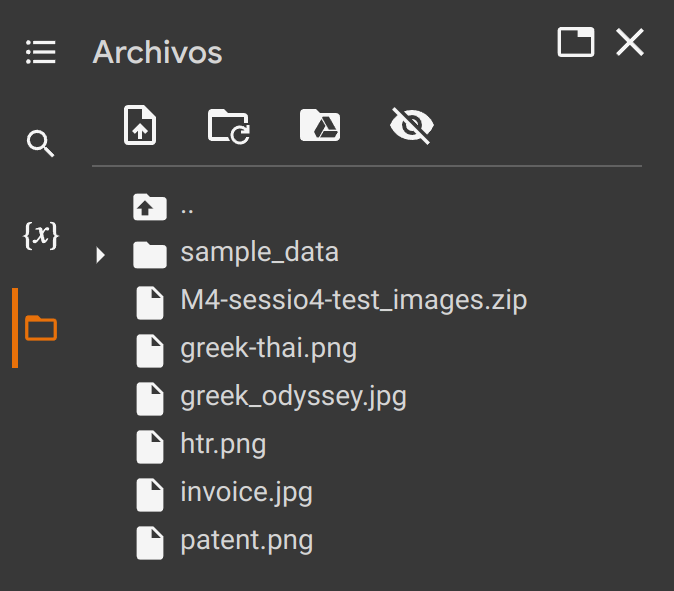

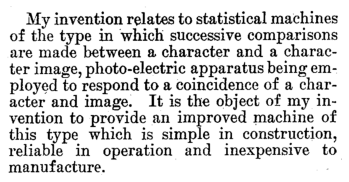

In [12]:
plt.imshow(img)
plt.axis('off')
plt.show()
plt.close()

## Llamada a Tesseract

Una vez se haya cargado la imagen correctamente, puede llamarse a `pytesseract` para transcribirla. La función más directa que nos otorga la biblioteca Pytesseract es `image_to_string`, que realizará la conversión según los parámetros OEM y PSM que le proveamos.

Los valores posibles del parámetro OEM (OCR Engine Mode) son los siguientes:

0. Motor de OCR de legado.
1. Motor LSTM (Red Neuronal).
2. Combinación Legado + LSTM.
3. Opción por defecto según lo que esté disponible.

Los valores posibles del parámetro PSM (Page Segmentation Mode) son los siguientes:

0. Solo detección de texto y orientación.
1. Segmentación de página automática usando OSD (Orientation and Script Detection).
2. Segmentación de página automática sin usar OSD ni proveer OCR.
3. Segmentación de página automática sin usar OSD.
4. Asumir una unica columna de texto de tamaño variable.
5. Asumir una única columna de texto de anchura uniforme.
6. Asumir un bloque de texto uniforme.
7. Tratar la imagen como una sola línea de texto.
8. Tratar la imagen como una sola palabra.
9. Tratar la imagen como una sola palabra en un círculo.
10. Tratar la imagen como un solo carácter.
11. Texto disperso en la imagen. Encontrar tanto como sea posible sin un orden particular.
12. Texto disperso con OSD.
13. Línea cruda. Tratar la imagen de entrada como una sola línea de texto ignorando hacks específicos de Tesseract.




---

**<font color='red'>
Pregunta 1: Para la imagen ```patent.png```, qué opción de PSM creéis más apropiada? Probad qué ocurre cuando empleáis las opciones 4, 5, 6, 7, 8 o 11. Por qué razón el texto transcrito es tan distinto?
</font>**

---

In [13]:
for config in [4, 5, 6, 7, 8, 11]:
  custom_config = f'--tessdata-dir "/usr/share/tesseract-ocr/4.00/tessdata" --psm {config}'
  transcription = pytesseract.image_to_string(img, config=custom_config)
  print(f"CONFIGURACION {config}")
  print("* "*40)
  print(transcription)
  print("\n")

CONFIGURACION 4
* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * 
My invention relates to statistical machines
of the type in which successive comparisons
are made between a character and a charac-
ter image, photo-electric apparatus being em-
ployed to respond to a coincidence of a char-
acter and image. It is the object of my in-
vention to provide an improved machine of
this type which is simple in construction,
reliable in operation and inexpensive to
manufacture. a



CONFIGURACION 5
* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * 
tla mn
oeoduag¢ /
SHS eno 228
SS 2 eset
gt Oy 3 BEE
Bea Sun og
Fe Sose aes
SegeeghSe
> a3 Ho S
2 > BU Sa OG
Ae yO S =
epgaee ss
S9S 85 08s
geghes ree
eee
so5en2,8
=" o3r = =
Da ao g AS
KES SESS 5
Bae ees:
S562 a8 8°
Bem RH EP 28
a Bs seue 25 E
ots qi ep 3
Ses epiges
a+ SEP y eee
= ores E ase
w Seog SEs
aepedse



CONFIGURACION 6
* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * *

El resultado seguramente sea muy bueno. No obstante, hay un error de transcripción bastante relevante al final del texto (una "a" extra). Esto se debe a que Tesseract espera una entrada perfectamente preprocesada: Requiere que el texto de entrada sea **lo más limpio posible** además de tener el **suficiente margen a su alrededor**.

## Preprocesado de Imagenes

Vamos a añadir un ligero borde a la imagen de prueba antes de pasarla a Tesseract y vamos a ver si el resultado mejora.

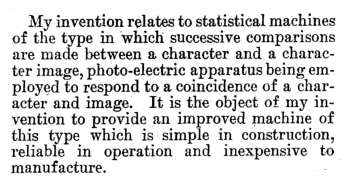

My invention relates to statistical machines
of the type in which successive comparisons
are made between a character and a charac-
ter image, photo-electric apparatus being em-
ployed to respond to a coincidence of a char-
acter and image. It is the object of my in-
vention to provide an improved machine of
this type which is simple in construction,
reliable in operation and inexpensive to
manufacture.



In [14]:
img = cv2.copyMakeBorder(img, 10, 10, 10, 10, cv2.BORDER_CONSTANT, None, [255,255,255])
plt.imshow(img)
plt.axis('off')
plt.show()
plt.close()

custom_config = r'--psm 6' # Recordad añadir vuestra opción predilecta aquí
transcription = pytesseract.image_to_string(img, config=custom_config)

print(transcription)

Bingo! Pero esta imagen de entrada es bastante fácil de tratar, puesto que no tiene ninguna de las dificultades que usualmente encontraríamos en un documento.

## Escritura Manual?

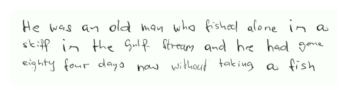

In [15]:
img = cv2.imread('htr.png')
img = cv2.copyMakeBorder(img, 10, 10, 10, 10, cv2.BORDER_CONSTANT, None, [255,255,255])
plt.imshow(img)
plt.axis('off')
plt.show()
plt.close()

In [16]:
custom_config = r'--psm 4' 
transcription = pytesseract.image_to_string(img, config=custom_config)

print(transcription)

Be was an ald man wha Fshe} alone iA @
SEVP TAR the SR Stream and he had 9%
esshty four dayd pau without taking a, ish



Los modelos preentrenados de Tesseract no funcionan con texto manuscrito. No obstante, y asumiendo que dispongáis de los datos, en la documentación se detalla como entrenar un modelo personalizado para tal uso.

En esta práctica no vamos a entrar en estos lodazales. No obstante, para los más avezados, podéis encontrar más información [aquí](https://tesseract-ocr.github.io/tessdoc/#training-for-tesseract-5).

## Otras características de Tesseract

### Distintos sistemas de escritura y lenguajes

Vamos a ver la lista de lenguajes que nuestra instalación de Tesseract soporta

In [17]:
!tesseract --list-langs

List of available languages (5):
ell
tha
spa
eng
osd


[Aquí](https://packages.ubuntu.com/search?keywords=tesseract-ocr&searchon=names&suite=groovy&section=all) tenéis una lista de lenguajes disponibles para Tesseract.

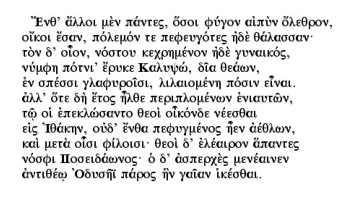

In [18]:
img = cv2.imread('greek_odyssey.jpg')
img = cv2.copyMakeBorder(img, 10, 10, 10, 10, cv2.BORDER_CONSTANT, None, [255,255,255])
plt.imshow(img)
plt.axis('off')
plt.show()
plt.close()

In [19]:
custom_config = r'--psm 6'
transcription = pytesseract.image_to_string(img, config=custom_config)

print(transcription)

"Ev0’ Gdot pev navtes, Soor Pbyov alxbv SheOpov,
otkot Eoav, nodepdv te mepevydres Oz BAacoav:
tov 8 olov, vootou Kexonuevov 5 yovaiKds,
voudn xérwi’ Epvee Kaus, dia Gedo,
év onéoot yhadvpotot, Mhavopévn xdowv etvan.
GAN re di) Frog He neputopévov Emavtdv,
tO ot énexAdoavto Geol olkdvde véeoBaL
ig Tedkny, 088" Evea xepvypévos fev aehov,
kal pert ofot ido: Geol 8° Ehéaipov &xavtes
vé0pt Hooeddevoc: 8 8’ domeoxés uevéeatvev
yr18ée) ‘OdvOAL napos fv yatav iKéoOaL.



Hay que decirle a Tesseract qué idioma tiene el texto de la imagen de entrada. A tal efecto, añadimos la opción -l y lo sucedimos con el idioma que vamos a emplear (ell hace referencia al griego).

In [20]:
custom_config = r'--psm 6 -l ell'
transcription = pytesseract.image_to_string(img, config=custom_config)

print(transcription)

Ἔνθ) ἄλλοι μὲν πάντες, ὅσοι φύγον αἰπὺν ὄλεθρον,
οἴκοι ἔσαν, πόλεμόν τε πεφευγότες ἠδὲ θάλασσαν:
τὸν δ᾽ οἷον, νόστου κεχρηµένον ἠδὲ γυναικός,
νύμφη πότνι’ ἔρυκε Καλυψώ, δῖα θείων,
ἓν σπέσσι γλαφυροῖσι, λιλαιοµένη πόσιν εἶναι.
ἀλλ’ ὅτε δὴ ἔτος ἦλθε περιπλοµένων ἐνιαυτῶν,
τῷ οἱ ἐπεκλώσαντο θεοὶ οἶκόνδε νέεσθαι
εἲς Ἰθάκην, οὐδ' ἔνθα πεφυγµένος ᾗεν ἀέθλων,
καὶ μετὰ οἷσι φίλοισι; θεοὶ δ᾽ ἐλέαιρον ἅπαντες
νόσφι Ποσειδάωνος: ὁ δ᾽ ἀσπερχὲς µενέαινεν
ἀντιθέῳ Ὁδυσῆι πάρος ἣν γαῖαν ἰκέσθαι.



### Podemos combinar varios sistemas de escritura?

Por supuesto! Solo hay que listar los idiomas de entrada separados por signos de suma + en el comando de entrada

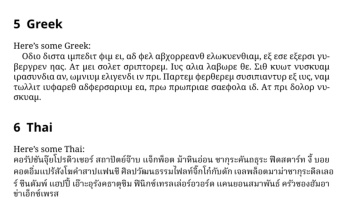

In [21]:
img = cv2.imread('greek-thai.png')
img = cv2.copyMakeBorder(img, 10, 10, 10, 10, cv2.BORDER_CONSTANT, None, [255,255,255])
plt.imshow(img)
plt.axis('off')
plt.show()
plt.close()

In [22]:
custom_config = r'--psm 6 -l tha+ell+eng'
transcription = pytesseract.image_to_string(img, config=custom_config)

print(transcription)

5 Greek
Here’s some Greek:

Όδιο διστα ιµπεδιτ Φιμ ει, αδ Φελ αβχορρεανθ ελωκυενθιαμ, εξ εσε εξερσι γυ-
βεργρεν πας. Ατ µει σολετ σριπτορεµ. Τυς αλια λαβωρε θε. Σιθ κυωτ νυσκυαμ.
ιρασυνδια αν, ὠμνιυμ ελιγενδι ιν πρι. Παρτεμ φερθερεµ συσιπιαντυρεξιυς, ναµ.
τωλλιτ ιυφαρεθ αδφερσαριυµ εα, πρω πρωπριαε σαεφολα Ιδ. Ατ πρι δολορ νυ-
σκυαμ.

6 Thai

Here’s some Thai:                                                                       .

คอรัปซันจุ้ยโปรดิวเซอร์ สถาปัตย์จ๊าบ แจ็กพ็อต ม้าหินอ่อน ซากุระคันถธุระ ฟิดสตาร์ท งี้ บอย

คอตอื่มแปรัสังโฆคําสาปแฟนซี ศิลปวัฒนธรรมไฟลท์จิ๊กโก๋กับดัก เจลพล็อตมาม่าซากุระดีลเลอ
ร์ ซีนดัมพ์ แฮปปี้ เอ๊้าะอุรังคธาตุซิม ฟินิกซ์เทรลเล่อร์อวอร์ด แคนยอนสมาพันธ์ ครัวซองฮัมอา
ข่าเอ็กซ์เพรส



---

**<font color='red'>
Pregunta 2: El tiempo de ejecucion de esta celda ha sido comparativamente mas largo que los anteriores (observad el checkbox a la izquierda de la celda del código con el tiempo de ejecución). Recordad que no le hemos dicho a Tesseract donde está el texto de cada tipo. A qué creéis que se debe este incremento en el tiempo?
</font>**

---

A modo de comparación, aquí tenéis la misma imagen sin emplear los idiomas múltiples.

In [23]:
custom_config = r'--psm 6'
transcription = pytesseract.image_to_string(img, config=custom_config)

print(transcription)

5 Greek
Here’s some Greek:

OSto Stota tuMedit Huy et, aS ea aByoppeave edAwkvevOuay, e§ ece efepot yu-
Bepypev nas. AT Wel GoAET apiTtopen. Tug aAta AaBwpe Ve. LO KUWT VUoKLaL
(paovvéia av, WUVLUU eAtyevil tv mpL TMaptep bepSepey GvaTLAaVTUp e€€ LUG, Va
TWAALT LUdaped ASdepoapluy Ea, TOW TpwTplae Gaedoda 16. AT mpt SoAop vv-
oxvau.

6 Thai

Here’s some Thai: .
aosUsugulushawos amiaddw usntioa sinfudou winszduagss Haaonsn 3 vos
Aonduusaladrawunud AavTausssulwavianlAdudn wandoamnsiwinsedataa
$ Guduvi woud rvaseasiadu Windinsadosor0sa uausouanrwus aswouduer
didadinsa



### Layout analysis y OCR

Podéis hacer que Tesseract ejecute la detección de los elementos de la imagen de entrada por vosotros. No obstante, la salida del modelo será más complicada que un mero texto, puesto que ahora dispondréis de las bounding boxes de cada detección de texto además de la transcripción.

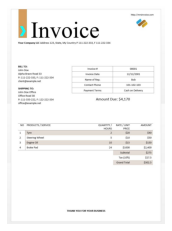

In [24]:
img = cv2.imread('invoice.jpg')
plt.imshow(img)
plt.axis('off')
plt.show()
plt.close()

In [25]:
d = pytesseract.image_to_data(img, output_type=Output.DICT)
print(d.keys())

dict_keys(['level', 'page_num', 'block_num', 'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'conf', 'text'])


Como podéis ver, como output tenemos un diccionario python con varias claves. 

---

**<font color='red'>
Pregunta 3: Averiguad el significado de cada clave. Podéis emplear la salida de la celda anterior (acceded a los campos correspondientes con `d[CAMPO]`)
</font>**

---

Una ayudita: Puesto que la documentación de Tesseract es un poco dispersa, podéis encontrar un resumen de estas claves y otras en este [enlace](https://medium.com/geekculture/tesseract-ocr-understanding-the-contents-of-documents-beyond-their-text-a98704b7c655). También tenéis la salida completa en la tabla de la celda siguiente.

- `level`: 
- `page_num`:
- `block_num`:
- `par_num`:
- `line_num`:
- `word_num`:
- `left`:
- `top`:
- `width`:
- `height`:
- `conf`:
- `text`:


In [26]:
import pandas as pd

pd.DataFrame.from_dict(d)

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,1,1,0,0,0,0,0,0,835,1150,-1,
1,2,1,1,0,0,0,61,17,425,152,-1,
2,3,1,1,1,0,0,61,17,425,152,-1,
3,4,1,1,1,1,0,61,17,425,152,-1,
4,5,1,1,1,1,1,61,17,44,151,0,","
...,...,...,...,...,...,...,...,...,...,...,...,...
229,5,1,25,1,1,1,316,1076,35,9,80,‘THANK
230,5,1,25,1,1,2,352,1076,37,9,95,YOU
231,5,1,25,1,1,3,394,1076,24,9,95,FOR
232,5,1,25,1,1,4,422,1076,26,9,95,YOUR


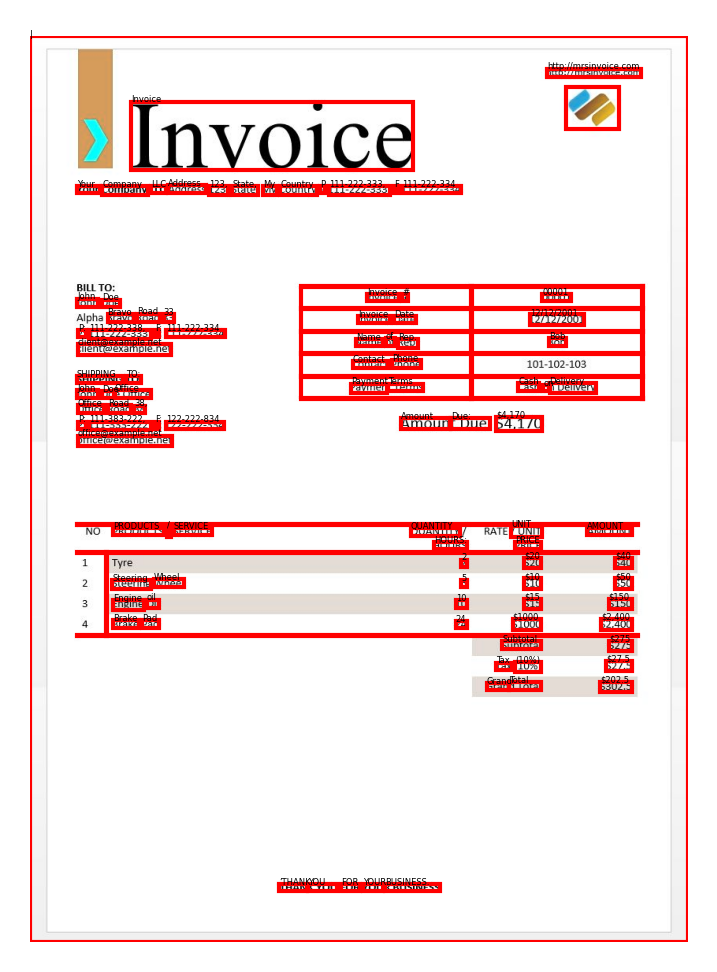

In [27]:
transcribe_and_decorate(img)

# Un problema real

La realidad es que, como habéis podido comprobar, los sistemas de OCR funcionan bastante bien por si mismos tratándolos como una "caja negra": abstraemos su funcionamiento interno, y de una imagen de entrada esperamos simplemente la salida ideal.

No obstante, estamos asumiendo un caso ideal en el que las imágenes de entrada son fáciles de leer. Cuando tenemos imagenes imperfectas, de baja resolución o con ruido, tenemos que intervenir manualmente y realizar tareas de preprocesado para garantizar un reconocimiento exitoso. Los propios desarrolladores de Tesseract proponen una lista de [tips & tricks ](https://tesseract-ocr.github.io/tessdoc/ImproveQuality.html) para mejorar la salida del modelo.

No hemos entrado en el detalle en clase de cómo detectar muchos de estos problemas gráficos de forma programática para no tener que desarrollar un sistema específico para cada imagen. Quiero remarcar que **existen formas de hacerlo empleando herramientas como el filtrado lineal y no lineal.**

---

## Cargar la Imagen

Primero vamos a cargar la imagen que vamos a emplear en esta parte de la práctica. La primera figura es la versión en color y la siguiente es la versión en escala de grises.

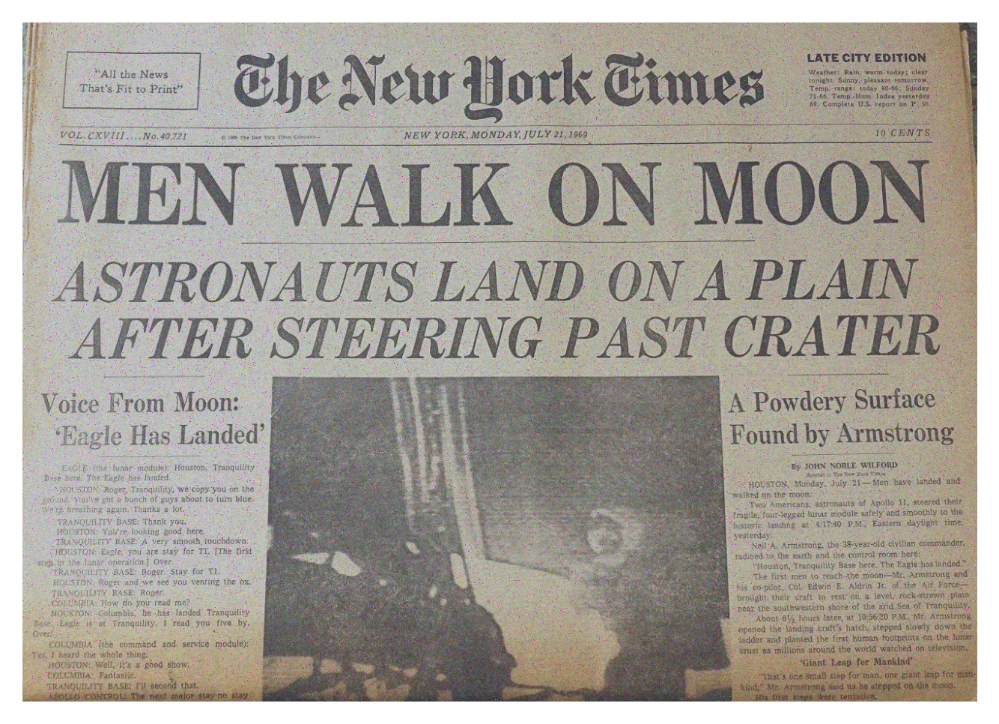

In [28]:
img = cv2.imread('times.png')
img_example = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(dpi=300)
plt.axis('off')
plt.imshow(img_example, cmap='gray')
plt.show()

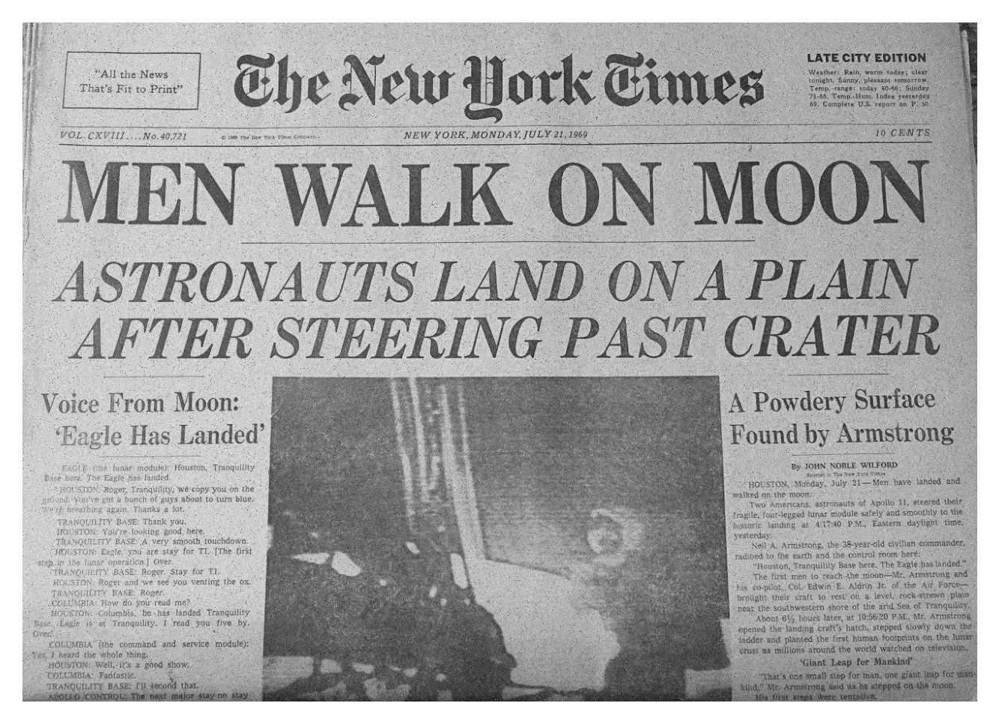

In [29]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img = img / 255

plt.figure(dpi=300)
plt.axis('off')
plt.imshow(img, cmap='gray')
plt.show()

---

**<font color='red'>
Pregunta 4: Estudiad la imagen. Qué defectos podéis encontrar que puedan suponer un problema para el reconocimiento?
</font>**

---

Vamos a ver qué sucede si tratamos de lanzar el OCR directamente.

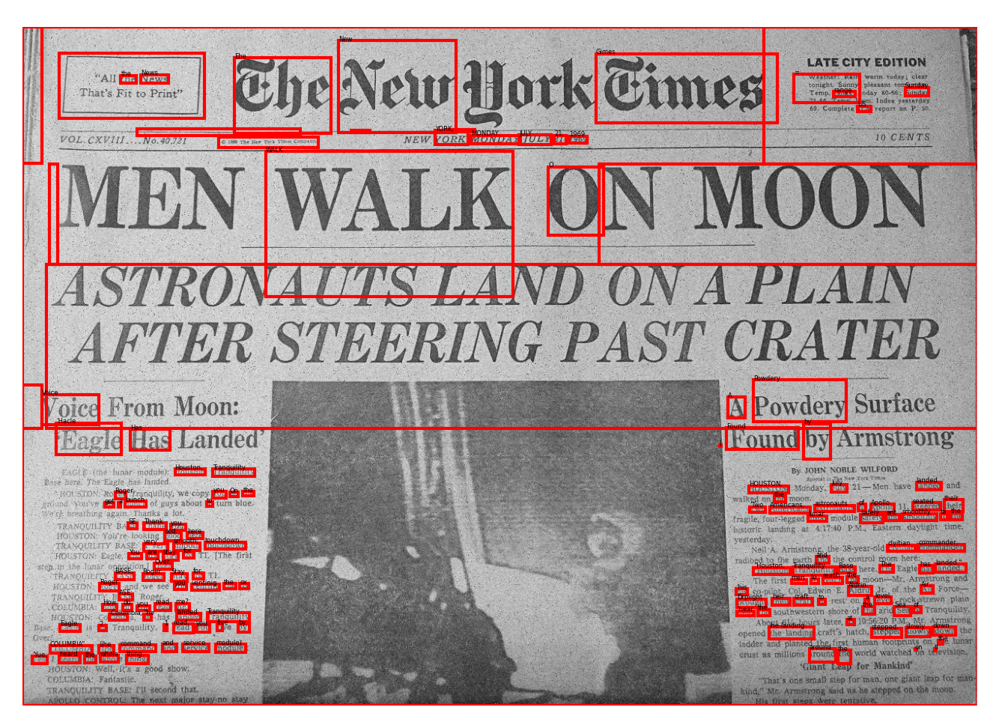

In [30]:
transcribe_and_decorate(to_int8(img))

Como podéis ver, Tesseract es incapaz de detectar correctamente las regiones con texto. Ni siquiera la tipografía más grande del título es consistentemente detectada.

---

**<font color='red'>
Pregunta 5: Analizad las causas. Por qué creéis que el sistema de Layout Analysis de Tesseract es incapaz de detectar donde está el texto? Recordad que las técnicas de Layout Analysis, como se vio en clase, en muchos casos no "entienden" el texto, solo buscan patrones en la imagen que tienen que ver con él.
</font>**

---

## Binarización

Tesseract incorpora un sistema de binarización propio basado en un threshold global. De ahí que hasta ahora hayamos podido pasarle imágenes sin tener que realizar este paso. No obstante, en muchos casos este binarizado puede no ser ideal. Vamos a probar de hacer una binarización global a esta imagen, a ver qué ocurre.

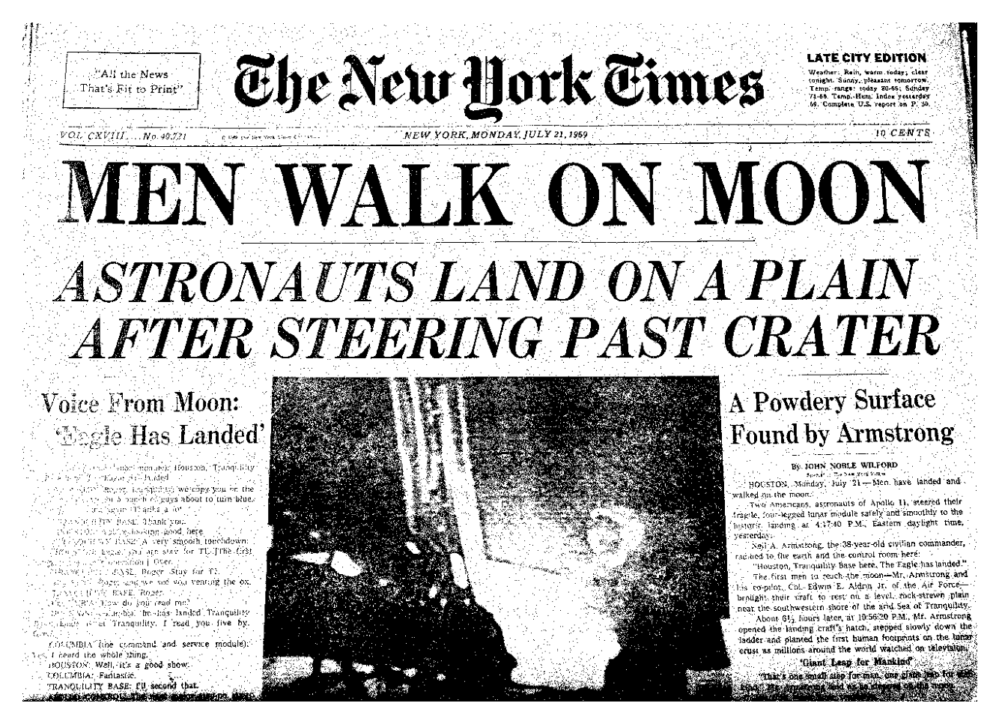

In [31]:
_, img_threshold = cv2.threshold(img, 0.5, 1.0, cv2.THRESH_BINARY)

plt.figure(dpi=300)
plt.axis('off')
plt.imshow(img_threshold, cmap='gray')
plt.show()

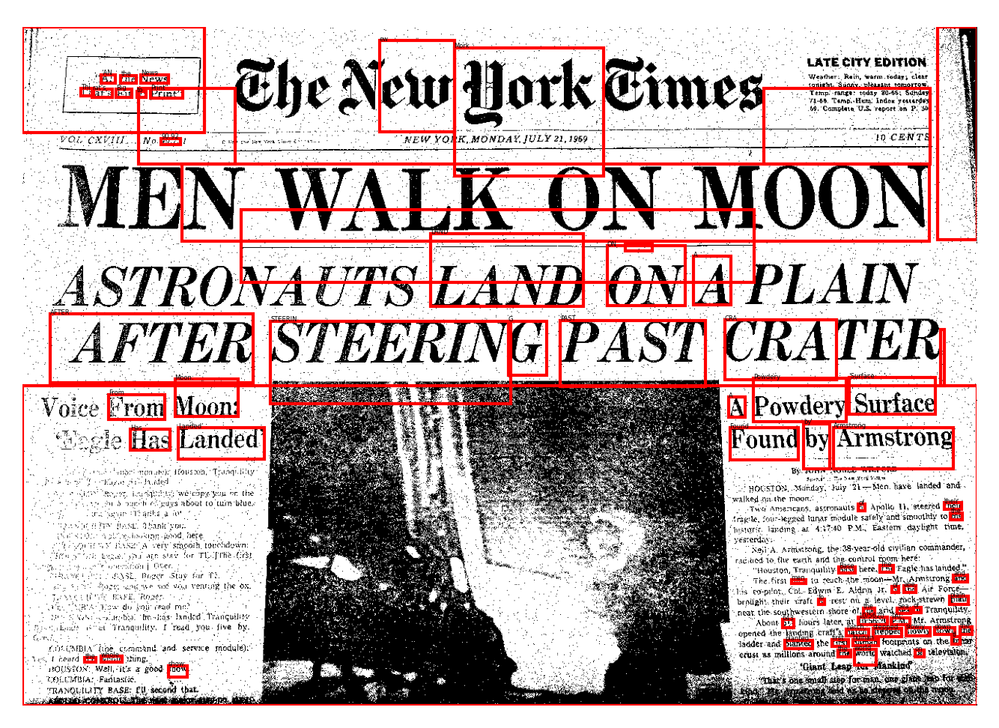

In [32]:
transcribe_and_decorate(to_int8(img_threshold))

---

**<font color='red'>
Pregunta 6: Qué problemas le véis a la binarización resultante? (Más allá de la permanencia de los defectos de la imagen inicial)
</font>**

---

Vamos a probar de emplear un thresholding adaptable, a ver si la situación mejora.

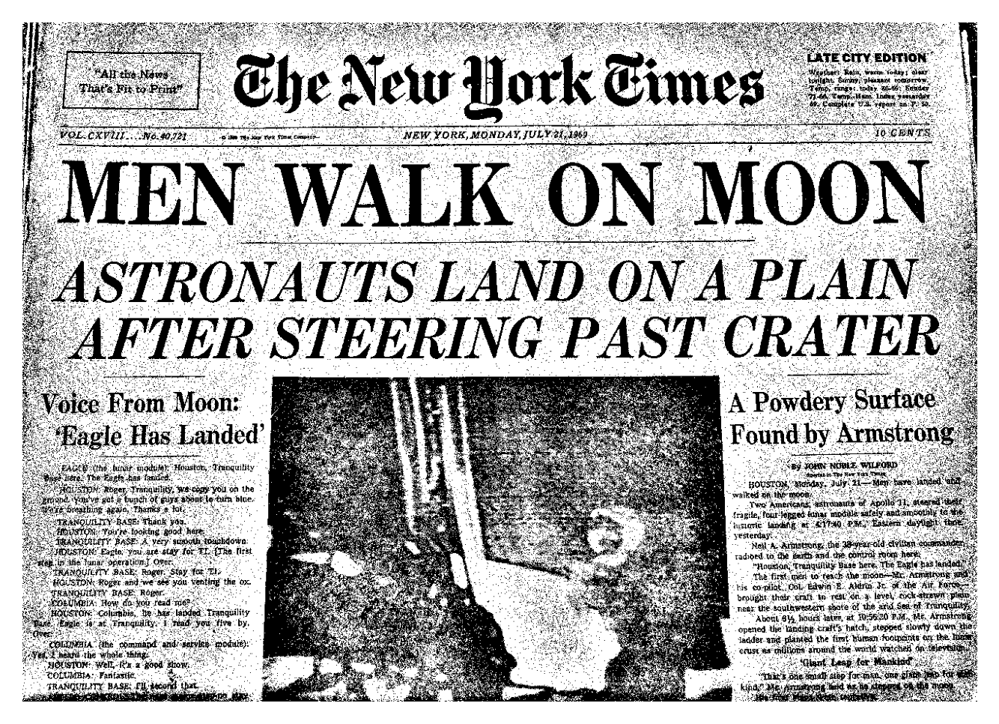

In [33]:
img_threshold = cv2.adaptiveThreshold(to_int8(img), 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 251, 2)

plt.figure(dpi=300)
plt.axis('off')
plt.imshow(img_threshold, cmap='gray')
plt.show()

---

**<font color='red'>
Pregunta 7: ¿Qué diferencia hay respecto a la versión anterior? ¿Qué problemas permanencen en la imagen?
</font>**

---

Vamos a emplear el modelo de document enhancement DocEnTr para ver si los resultados son mejores o no. La salida es la imagen siguiente:

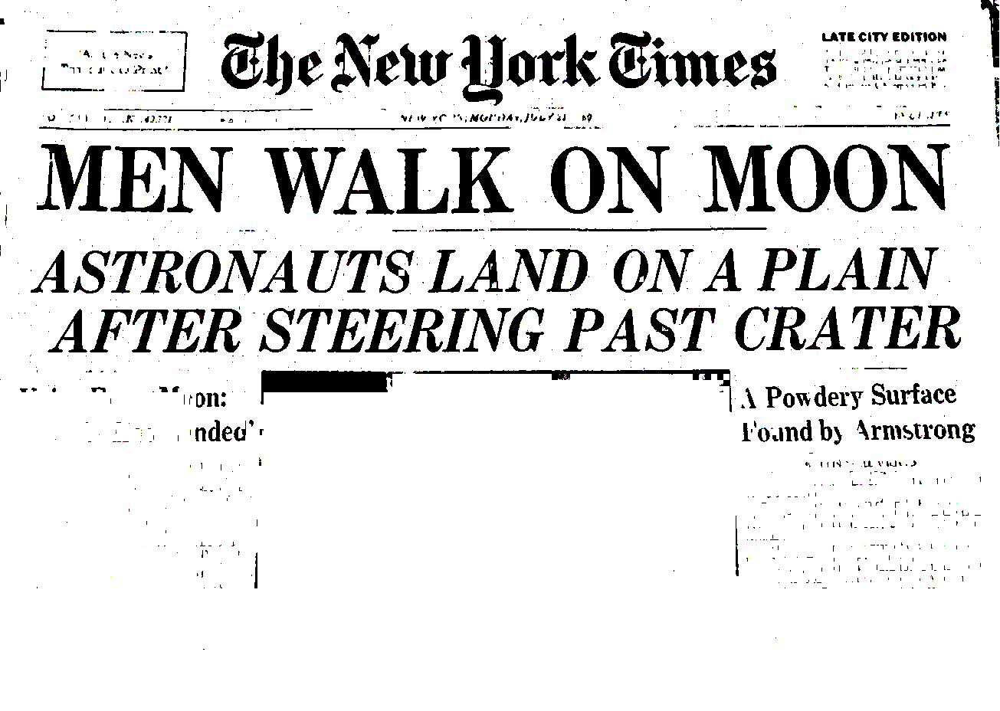


---

**<font color='red'>
Pregunta 8: El modelo ha confundido el texto pequeño con ruido. Como humanos, ¿os era fácil leer el texto en la imagen inicial? Si pudiérais cambiar algo de cómo fue capturada (método, dispositivos, etc.), qué haríais para que analizar la imagen computacionalmente fuera más simple? ¿Qué técnica de Deep Learning vista en clase (Sesión 3) podríais intentar de emplear para solucionar algunos de estos problemas?
</font>**

---

## De-Noising

Puesto que hay defectos de la imagen de los que no parecemos capaces de librarnos solamente con una binarización, vamos a intentar emplear técnicas un poco más específicas para mejorar la imagen. En particular, vamos a eliminar el ruido. **Vamos a centrarnos en sacar el titular de la noticia correctamente**.

Por ruido entendemos las perturbaciones de carácter local en la imagen; esencialmente, que un píxel o grupo aislado de píxeles no sean coherentes con sus vecinos. En particular, se asume que el orígen de estas perturbaciones es ajeno a la escena capturada -- son causados por el dispositivo de captura, el medio de almacenamiento o la fase de compresión.

- Ruido Gaussiano: Os tenéis que imaginar el ruido Gaussiano como añadirle la estática de una televisión a vuestra imagen. Puede apreciarse la presencia de píxeles de colores ligeramente anómalos. Un [ejemplo](https://en.wikipedia.org/wiki/Gaussian_noise).
- Ruido Salt: Hay píxeles aislados que tienen intensidad máxima (color blanco) sin tener coherencia con la región circundante de la imagen.
- Ruido Pepper: Hay píxeles aislados que tienen intensidad mínima (color negro) sin tener coherencia con la región circundante de la imagen.
- Artefactos de compresión: Si tenéis una imagen comprimida en un formato con pérdida, se pueden apreciar efectos sobre la imagen del tipo: aparición de cuadrados de colores levemente difuminados, pérdida de detalles, etc. Tenéis un ejemplo [aquí](https://en.wikipedia.org/wiki/Compression_artifact). 

---

**<font color='red'>
Pregunta 9: ¿Qué tipos de ruido podéis encontrar en la imagen? Adjuntad una captura de una región pequeña donde indiquéis (mediante flechas o recuadros) ejemplos del ruido que encontréis.
</font>**

Tenéis que mirar la **imagen en color original**, mostrada más arriba en el notebook.

---

Vamos a tratar de eliminar el ruido. Probaremos dos técnicas de filtrado no lineal típicas para estos casos: el filtro de Mediana y el filtro morfológico.

Primero el de mediana.

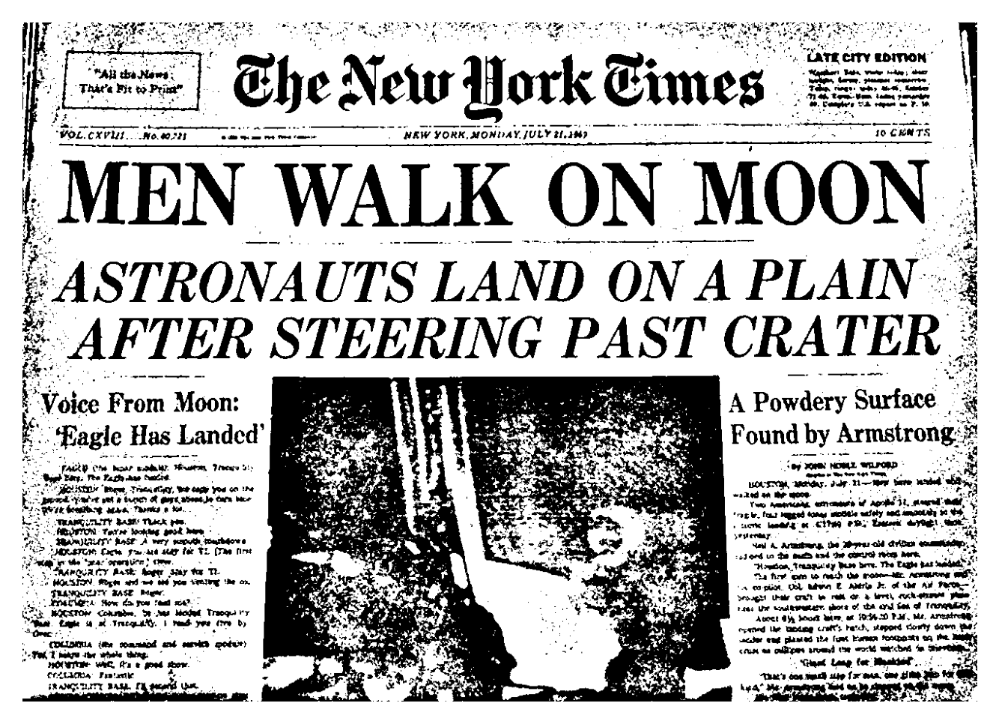

In [42]:
img_denoised =  cv2.medianBlur(to_int8(img), 3)
img_denoised = cv2.adaptiveThreshold(img_denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 251, 2)

plt.figure(dpi=300)
plt.axis('off')
plt.imshow(img_denoised, cmap='gray')
plt.show()

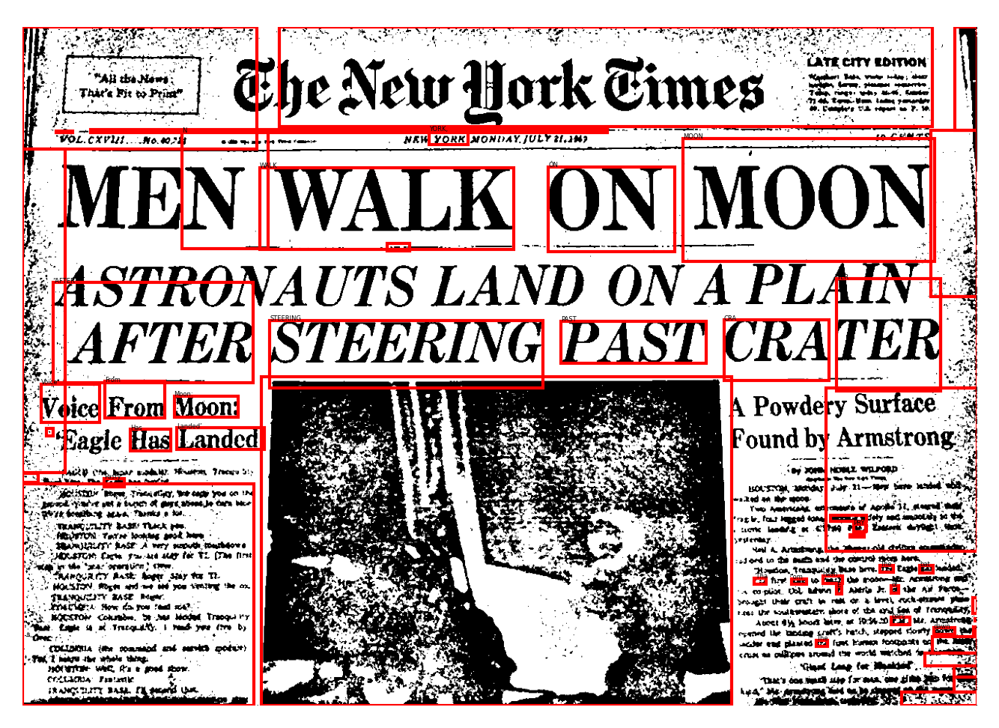

In [43]:
transcribe_and_decorate(img_denoised)

Ahora el morfológico

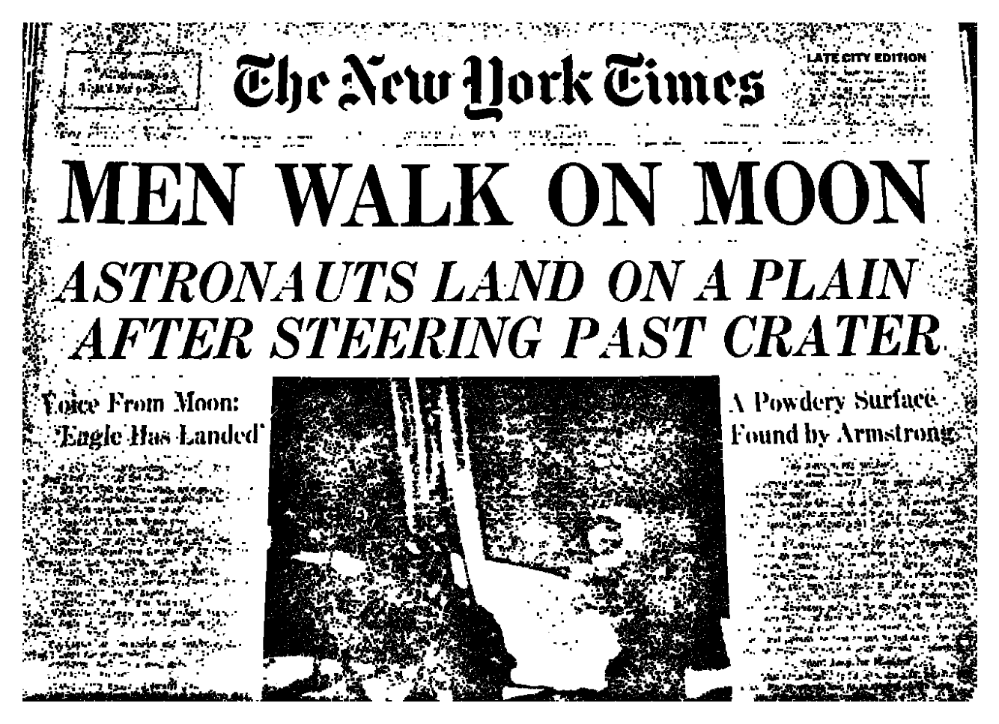

In [68]:
kern = np.ones((3, 3))

img_denoised = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kern)
img_denoised = cv2.adaptiveThreshold(to_int8(img_denoised), 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 251, 2)

plt.figure(dpi=300)
plt.axis('off')
plt.imshow(img_denoised, cmap='gray')
plt.show()

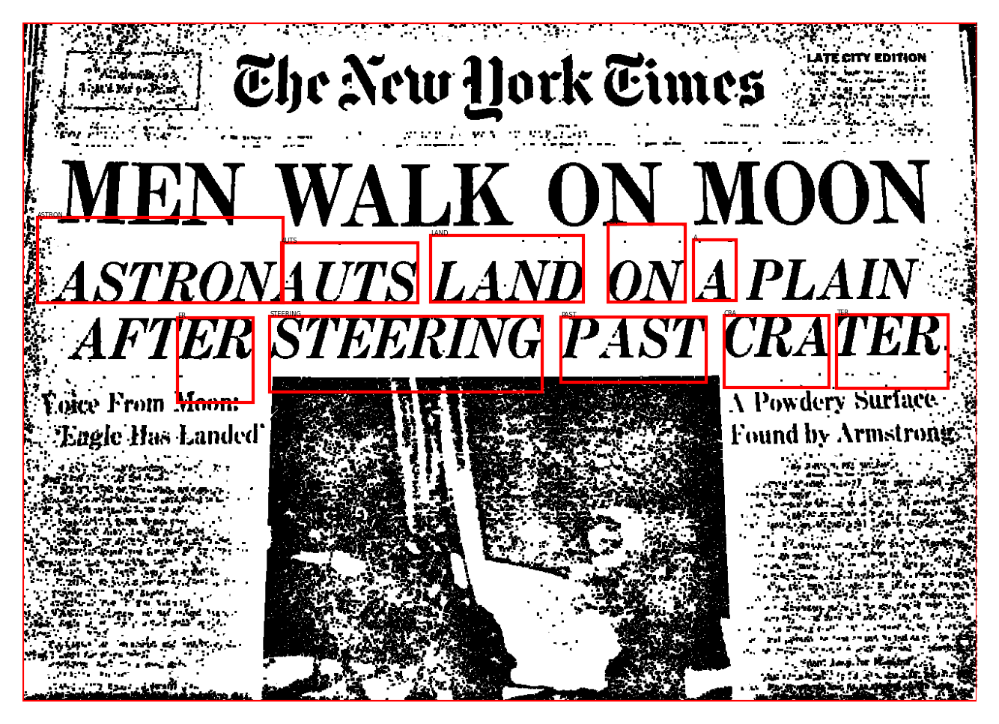

In [69]:
transcribe_and_decorate(img_denoised)

---

**<font color='red'>
Pregunta 10: ¿En qué ha ayudado y en qué no cada tipo de filtro empleado aquí?
</font>**

---

Por último, vamos a combinarlos y a sacar los resultados de transcripción

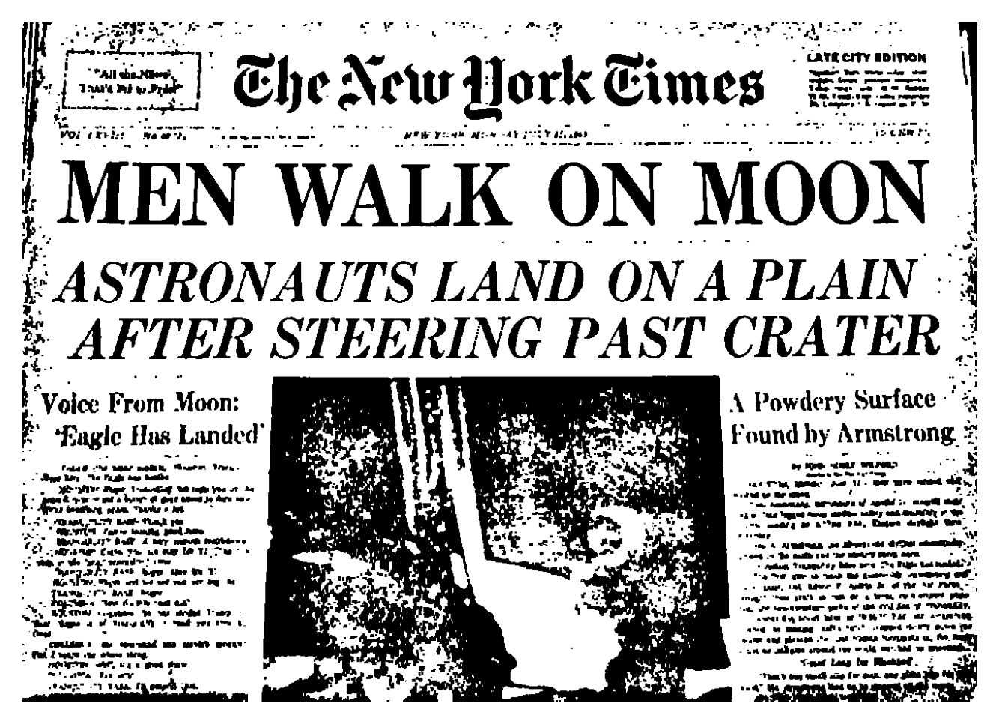

In [80]:
kern1 = np.ones((3, 1))
kern2 = np.ones((3, 1))
kern3 = np.ones((1, 3))

img_denoised = cv2.medianBlur(to_int8(img), 3)
img_denoised = cv2.morphologyEx(img_denoised, cv2.MORPH_CLOSE, kern1)
img_denoised = cv2.morphologyEx(img_denoised, cv2.MORPH_OPEN, kern2)
img_denoised = cv2.morphologyEx(img_denoised, cv2.MORPH_CLOSE, kern3)
img_denoised = cv2.adaptiveThreshold(img_denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 251, 2)

plt.figure(dpi=300)
plt.axis('off')
plt.imshow(img_denoised, cmap='gray')
plt.show()

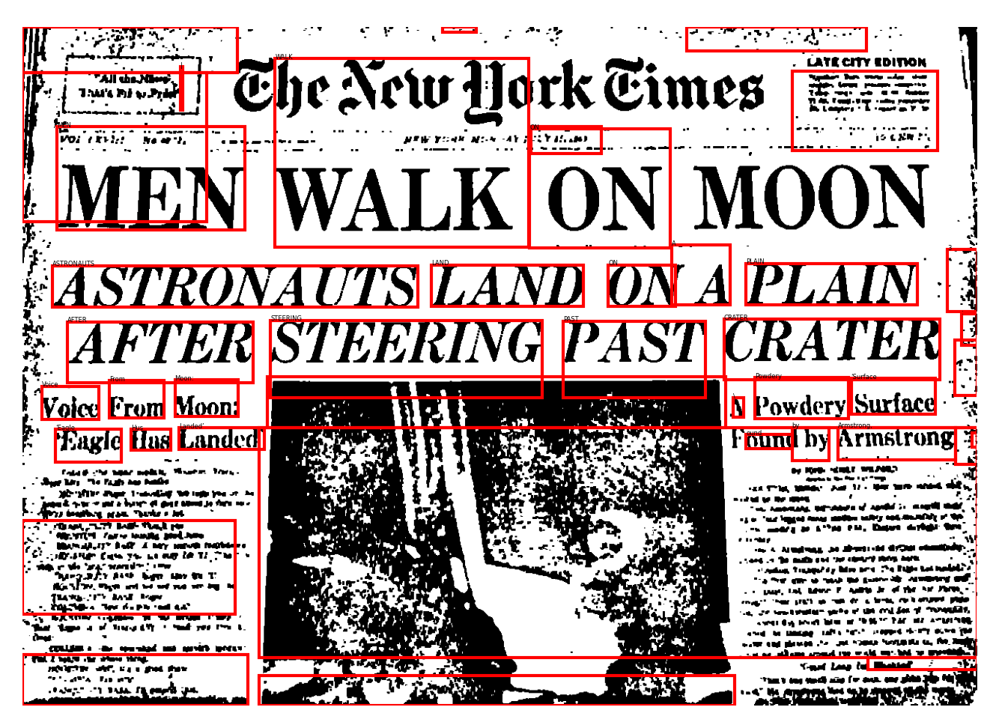

In [81]:
transcribe_and_decorate(img_denoised)

El resultado es que el modelo ahora puede encontrar el texto que yace claramente en el papel de forma mucho más confiable que sin el preprocesado. Cabe destacar que este ha sido un ejemplo con un solo paso; el preprocesado usualmente se puede complicar más para obtener mejores resultados.

No obstante, en este caso es bastante evidente que será difícil que el modelo logre hacer OCR completo sobre la imagen entera sin más. La razón la deberíais haber respondido en la pregunta 8 :)

---

**<font color='red'>
Me gustaría que cerrárais el informe con una sección de conclusiones resumiendo los puntos principales de esta práctica: qué tener en cuenta al hacer OCR con Tesseract, las complejidades del modelo y la dificultad del preprocesado.
</font>**

---